# Lab 1: Extreme Quantization

## Your engineering task

In this lab, you are not trying to find the smallest possible model. You are trying to decide which precision level is the best candidate for a constrained deployment target.

By the end of the lab, you should be able to answer:
How far can I reduce numerical precision before the deployment trade-off is no longer acceptable?

Record evidence for: FP32 baseline quality, model size, post-training quantization results, generated text behavior, ternary QAT, binary QAT, and the precision level you would take forward for hardware benchmarking.

This lab produces **model-side evidence**. It helps you choose a candidate representation, but it does not prove efficient execution on an Arm device. Target-device claims require additional evidence such as runtime latency, runtime memory, supported low-bit execution paths, and power or thermal behavior.

### Evidence worksheet

Keep this table updated as you work. You will use it when you return to the course page.

| Evidence | Your result | Initial interpretation |
|---|---|---|
| FP32 baseline loss / perplexity, if reported |  |  |
| FP32 generated sample quality, if generated |  |  |
| FP32 model size or parameter-storage estimate |  |  |
| 8-bit PTQ loss / size |  |  |
| 4-bit PTQ loss / size |  |  |
| 2-bit PTQ loss / size |  |  |
| Lowest PTQ bit-width that still looks usable |  |  |
| First PTQ bit-width that looks unacceptable |  |  |
| Ternary QAT result |  |  |
| Binary QAT result |  |  |
| Best model-side candidate to benchmark next |  |  |
| Evidence still needed on target Arm hardware |  |  |

Do not wait until the end of the notebook to fill this in. Record results near the output where they appear.

## Introduction

Deep neural networks are often large and computationally expensive, particularly when trained and stored in full-precision (FP32) floating-point format. While 8-bit quantization has become an industry-standard approach for improving efficiency and reducing model size, recent research has shown that pushing to even [lower bit-widths can offer improved accuracy-to-memory trade-offs](https://arxiv.org/abs/2502.02631#:~:text=The%20optimal%20bit%2Dwidth%20for,1.58%2Dbit%20offers%20superior%20results.).

This brings us into the realm of **extreme quantization**, where weights (and sometimes activations) are quantized to 4 bits, 2 bits, or even just 1 bit (as in binary networks).

The benefits can be substantial:

- A binary network that uses just **1 bit per weight**, reduces model size by **32×** compared to FP32.
- Speedups arise from using **bitwise operations** (e.g. XNOR + popcount) or **lookup tables (LUTs)** in place of expensive multiply accumulates.
- These operations are especially efficient on **Mobile or Edge platforms**, where memory and compute resources are constrained.

However, this efficiency gain often comes at a cost: **accuracy often degrades** however special training procedures or architectural modifications can mitigate this. Moreover, software support for sub-8-bit inference remains limited in many libraries.

This lab provides a hands-on exploration of these trade-offs. You will:

- Train a baseline FP32 model language model.
- Progressively quantize it to **8-bit**, **4-bit**, **2-bit**, and **1-bit** with varying **group-sizes**.
- Observe the negative impact on accuracy.
- Implement Extreme ternary/binary quantization. 
- Optimize the extreme quantized model to achieve near FP32 accuracy with Quantized-Aware-Training (QAT).

Our goal is to build a strong intuition for the trade-offs involved in extreme quantization, and to motivate the use of advanced techniques like quantization-aware training (QAT) to unlock even lower bit-widths, potentially inspiring you to design your own highly compressed, efficient models.

---

### Lab Objectives

1. Demonstrate the impact of 8 → 1-bit quantization with varying group-sizes on model size, speed, and accuracy.    
2. Understand and Implement Quantized-Aware-Training (QAT) to recover accuracy degredation from extreme quantization.
3. Lay the foundation for future labs on **QAT** and **custom kernel design**.

By the end of this lab, you'll understand the trade-offs between compression and performance, particularly for **deployment on Arm-based edge devices**.

---

## 1. Baseline FP32 Model Training

Let's start by training a **Autoregressive Transformer Language Model (LM)** using the popular **TinyShakespeare dataset**, a compact corpus composed of Shakespeare's text. We have already provided the training code for you. The model's task is next-token prediction, given a sequence of text, the model is trained to predict the next word or character.

After training the model, we will explore post-training quantization, a commonly used method that quantizes the neural network without requiring retraining.

> You can run the following cell to begin training the model, It is advised to use a GPU for this as it may take up to 15 minutes. Should you get out of memory errors, try reducing the batch size. 

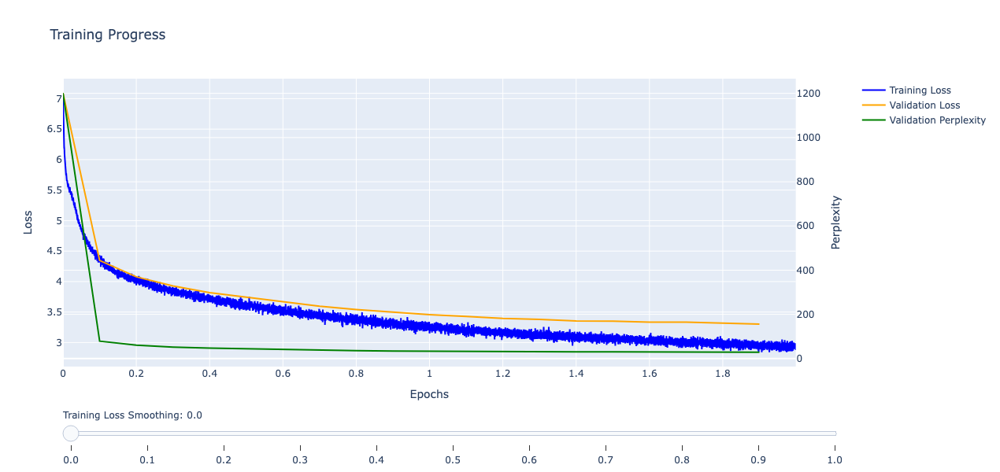

`Trainer.fit` stopped: `max_epochs=2` reached.


In [1]:
from src.lab1.shakespeare_trainer import ShakespeareModule, PlotlyCallback
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
import os
from pytorch_lightning import Callback

os.environ["TOKENIZERS_PARALLELISM"] = "false"

module = ShakespeareModule(
    vocab_size      = 1024,
    d_model         = 128,
    nhead           = 8,
    num_layers      = 6,
    dim_feedforward = 512,  
    dropout         = 0.15, 
    learning_rate   = 2e-4,
    batch_size      = 64,
    sequence_length = 256,  
    num_workers     = 4,
    weight_decay    = 0.05,
    max_train_samples = 750_000,
    max_val_samples   = 1_000,
    max_test_samples  = 1_000
)



checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',                                 
    mode='min',                                        
    save_top_k=1,                      
    save_last=True,                             
    dirpath='./src/lab1/checkpoints',                 
    filename='float-best'                               
)

# Create a directory for plots
os.makedirs('./plots', exist_ok=True)

trainer = pl.Trainer(
    max_epochs=2,
    callbacks=[
        PlotlyCallback(val_check_interval=0.1),
        checkpoint_callback
    ],
    accelerator="auto",
    devices="auto",
    precision="16-mixed",
    val_check_interval=0.1,
)

trainer.fit(module)

## 2.  Quantization Fundamentals & Computational bottlenecks

While your model is training, let’s briefly explore the theory behind quantization through the lens of hardware-level computational bottlenecks to understand why it effectively reduces memory usage and latency. To see how quantization improves efficiency, we first need to examine the primary computational bottleneck in AI systems: **matrix multiplication**. These operations dominate inference workloads, and by understanding their limitations, we can design and apply quantization techniques to make them significantly more efficient.


###  Matrix Multiply: A Naive Implementation

To understand how quantization effections matrix multiplication, lets look at the operation at a element-wise level.

For a matrix multiplication between input activation matrix $X \in \mathbb{R}^{M \times K}$ the weight matrix $W \in \mathbb{R}^{K \times N}$, and the resulting activation output matrix $Y \in \mathbb{R}^{M \times N}$ the operation is defined as:

$Y_{m,n} = \sum_{k=0}^{K-1} X_{m,k} \cdot W_{k,n}$


> Lets implement this naively in python.


In [2]:
import torch

# Matrix dimensions
M, N, K = 10, 32, 64

# Activation and weight matrices
X = torch.randn(M, K)
W = torch.randn(K, N)

# Output matrix
Y = torch.empty(M, N)

# Manual matrix multiplication (naive loop-based)
# Shapes: X [M, K], W [K, N]  -->  Y [M, N]
for m in range(M):
    for n in range(N):
        acc = 0           # accumulator register (FP32)
        for k in range(K):
            x = X[m, k]   # 1. load activation (32‑bit read)
            w = W[k, n]   # 2. load weight     (32‑bit read)
            acc += x * w  # 3. MAC (FP32)
        Y[m, n] = acc     # 4. store result    (32‑bit write)

# Validate result against PyTorch's matmul
assert torch.allclose(Y, torch.matmul(X, W), rtol=1e-3)


###  Matrix Multiply: Loop Structure and Compute Breakdown

The above matrix multiplication is implemented with three nested loops over dimensions $M$, $N$, and $K$, where:

- $M$ is the number of rows in the input $X$ (i.e., the batch size),
- $N$ is the number of output features,
- $K$ is the number of input features.

- The outer loops run over $M$ and $N$ to compute each output element.
  
- The inner loop runs over $K$ and performs the main computation.

In the innermost loop, a dot product is computed using **multiply-accumulate (MAC)** operations: each activation is multiplied by its corresponding weight and added to a running sum. This is a core operation in neural networks, used to compute the weighted inputs to each neuron.


---

####  Each MAC requires the folloing operations:

- **Two memory reads**:  
  - Load element `X[m, k]`  
  - Load element `W[k, n]`

- **One multiplication**:  
  - `x * w`

- **One memory write**:  
  - Accumulate into the result: `acc[m][n] += ...`
 
---


###  The Bottlenecks in Matrix Multiplication

Two key factors limit the speed of matrix multiplication:

1. **Memory bandwidth** — how fast activations and weights can be fetched/written to memory.  
2. **Compute throughput** — how fast multiply-accumulate operations can be executed (typically measured in **TOPS**, or Tera Operations Per Second).

Hardware trends, however, consistently show that compute capabilities (**TOPS**) are improving at a significantly [faster rate than memory bandwidth](https://arxiv.org/abs/2403.14123). As a result, **memory bandwidth is increasingly becoming the primary bottleneck** for neural network inference.



This is clearly illustrated in the figure below: while the performance of floating-point operations (grey line) continues to scale rapidly, both **interconnect bandwidth** (blue) and **system memory bandwidth** (green) lag behind.

Consequently, **efficient memory access patterns and compression strategies** are becoming essential to reduce latency and improve throughput.


<center><img src="./assets/lab1/bandwidth_vs_flops.png" width="800"/></center>
<center>Gholami, Amir, et al. *"AI and the Memory Wall."* IEEE Micro, 2024.</center>
<br>

This trend is also very improtant when considering the autoregressive decoding process of LLMs, in which arithmetic intensity is significantly lower and memory bandwith pressure is much higher, due to frequent memory access to the store of previous activations (The KV Cache). To make matters worse, the memory bottleneck is even more critical in light of emerging [*inference-time scaling laws*](https://cdn.openai.com/papers/trading-inference-time-compute-for-adversarial-robustness-20250121_1.pdf), which show that increasing the inference time compute (e.g. autoregressive decoding stage) can improve model accuracy and usefulness. 
 
**Thus, optimizing memory bottlenecks is not just a systems concern, but a foundational enabler of next-generation model capabilities**.


---



###  Reducing Memory Bandwidth via Quantization

So how can we reduce the memory bandwidth load caused by:

```python
x = X[m, k]
w = W[k, n]
...
y = accum 
```

 One obvious solution is to **reduce the size of memory reads and writes** (`x`, `w`, `y`). This can be done by lowering the **numerical precision** of weights and activations, allowing them to be represented using **fewer bits**.

In practice:

- In **edge AI**, it's common to use [**8-bit integer quantization**](https://arxiv.org/pdf/2106.08295) for weights and activations.
- This offers up to a **4× reduction in memory bandwidth** compared to FP32, with **negligible accuracy loss** in many cases.
- Further gains are possible using **4-bit**, **2-bit**, or **1-bit** formats.

Despite reduced precision, these [ultra-low-bit models can still deliver high accuracy and significant efficiency gains](https://arxiv.org/abs/2402.17764).

---

## 3.  Symmetric Linear Quantization

Let’s start by looking at the simple but effective process of **symmetric linear quantization**, which maps floating-point values to **signed integers**, assuming that the distribution of values is **approximately zero-centered**.

For a bit-width $(b)$, signed integers can represent values in the range:
 
#### $\text{ values: } \{x^{\text{intb}} \in \mathbb{Z} : -2^{b-1} \leq x < 2^{b-1}\}$

This is well-suited for weight tensors and certain activation distributions (e.g. after BatchNorm), where the data naturally clusters around zero.

---

###  Quantization and Dequantization Equations

In symmetric quantization, we assume the value range is symmetric around zero and use a **single scale factor** to map from the floating point paramter distribution to the integer. The quantization and dequantization equations simplify to:

### $q = Q(r, s) = \text{round}\left(\frac{r}{s}\right)$  
### $\hat{r} = s \cdot q$

Where:

- $ s $: **scale factor** — defines the step size between quantization levels
- $ r $: **real number** - defines the real values number to be quantized
- $ q $: **quantized number** - defines the integer quantized value corresponding to $r$
- $ \hat{r} $: **deqauntized number** - defines the dequantized real number

The scale is computed from the absolute max of the observed range:

### $ s = \frac{r_{\text{max-abs}}}{q_{\text{max}}} \quad\quad\text{where } \quad r_{\text{max-abs}} = \max(|r_{\text{min}}|, |r_{\text{max}}|) \quad \text{and} \quad q_{\text{max}}=2^{b-1}-1$

 - $b$: bit-width — the number of bits allocated for representing each quantized value. For example, $b=8$ corresponds to an integer range of [−127, +127].

This ensures the floating point range is linearly mapped to the symmetric integer range with zero always preserved exactly.

---

###  Why Symmetric Quantization?

Symmetric quantization **simplifies hardware implementation** and is particularly effective when:

- The distribution is **centered around zero** (e.g., weights after training)
- Deterministic mapping to and from integer space is desirable
- Hardware **vector units (e.g., SIMD/NEON)** benefit from no offset handling

However, when distributions are heavily skewed (e.g., post-ReLU activations), this method can waste representational capacity compared to asymmetric quantization.

>  Next, we’ll implement this in PyTorch using signed integer types and apply it to weights and activations.




In [3]:
import torch
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

def compute_int_scale(r, bitwidth=8):
    r_max = torch.max(r.abs())
    q_max = 2**(bitwidth - 1) - 1
    scale = r_max / q_max
    return scale

def quantize_int(x, scale, bitwidth=8):
    q_max = 2**(bitwidth - 1) - 1
    q = torch.clamp(torch.round(x / scale), -q_max, q_max)
    if bitwidth <= 8:
        return q.to(torch.int8)
    else:
        return q.to(torch.int32)
    
def dequantize_int(q, scale):
    return scale * q.to(torch.float32)

output = widgets.Output()

def plot_interactive(bitwidth):
    with output:
        clear_output(wait=True)
        scale_w = compute_int_scale(w, bitwidth)
        qw = quantize_int(w, scale_w, bitwidth)
        dqw = dequantize_int(qw, scale_w)
        error = torch.norm(w - dqw, p='fro').item()

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

        ax1.hist(w.flatten().numpy(), bins=100, color='blue')
        ax1.set_title('Full Precision Weights')
        ax1.set_xlabel('Weight Value')
        ax1.set_ylabel('Count')

        ax2.hist(dqw.flatten().numpy(), bins=250, color='orange')
        ax2.set_title(f'{bitwidth}-bit Quantized Weights\nQuantization Error: {error:.4f}')
        ax2.set_xlabel('Weight Value')
        ax2.set_ylabel('Count')

        plt.tight_layout()
        plt.show()

# initialize a random gaussian distribution for weight values
w = torch.randn(128, 128) * torch.rand(1) * 100 

bitwidth_slider = widgets.IntSlider(value=6, min=2, max=16, step=1, description='Bitwidth:')
widgets.interactive(plot_interactive, bitwidth=bitwidth_slider)

display(bitwidth_slider, output)
plot_interactive(bitwidth_slider.value)

IntSlider(value=6, description='Bitwidth:', max=16, min=2)

Output()

The interactive plot above demonstrates the relationship between bitwidth and quantization in neural networks. As you adjust the bitwidth slider, you can observe how the deqauntized weight distribution changes and how the quantization error (measured by the Frobenius norm) increases as bitwidth decreases:

$ \text{Quantization Error} = \sqrt{\sum_{i,j} (w_{i,j} - Q(w_{i,j}, s))^2} $

This degradation occurs because lower bitwidths (e.g., 2-4 bits) have fewer quantization levels available, leading to increased rounding errors.

## 4.  Group-wise Quantization

🛠️ To mitigate this accuracy loss at low bitwidths, we can use **group-wise quantization** - a technique that reduces quantization granularity by operating on smaller groups of weights individually rather than the entire tensor at once.



Instead of applying a single global scale across the entire tensor (i.e., *per-tensor quantization*), **group-wise quantization** partitions the weight tensor into **fixed-size groups** (e.g., along the input or output dimension). Each group receives its own **independently computed scale**.

This allows the quantizer to better capture **local variations** in the data distribution, while keeping the quantization scheme **symmetric** (i.e., zero-point is fixed at 0).

---

For a group index $g$, let the group contain a subset of values:

### $r_g = \{ r_{g,0}, r_{g,1}, \dots, r_{g,n-1} \}$

We define the per-group scale:

### $s_g = \frac{\max_j |r_{g,j}|}{q_{\text{max}}}, \quad \text{where } q_{\text{max}} = 2^{b-1} - 1$

Each floating-point value $r_{g,j}$ in the group is quantized as:

### $q_{g,j} = \mathrm{round}\left(\frac{r_{g,j}}{s_g}\right)$

And dequantized as:

### $\hat{r}_{g,j} = s_g \cdot q_{g,j}$

---

Where:

- $g$ indexes the group (e.g., every 16 weights if group size = 16)  
- $j$ indexes the element within group $g$, where $j \in \{0, \dots, n-1\}$  
- $s_g$ is the group-specific scale, computed independently for each $g$  
- $q_{g,j}$ is a signed integer in $[-2^{b-1}, 2^{b-1} - 1]$  
- $\hat{r}_{g,j}$ is the reconstructed (dequantized) floating-point value

---

While this method increases quantization metadata (i.e., one scale *per-group* instead of *per-tensor*), it **significantly reduces quantization error**—particularly at low bit-widths by better modeling the **local statistics** of the data, all while preserving the efficiency benefits of **symmetric quantization** (e.g., no need to subtract/add zero-points).

>  Let’s now implement this in code below!



In [4]:
import torch
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output

# let's initialize a example weight tensor e.g one that could be used in a linear layer 
w = torch.randn(128, 128) * torch.rand(1) * 100

# This function computes a scale value per group of the tensor
def compute_int_scale_groupwise(x, bitwidth=8, group_size=None):
    if group_size is None:
        group_size = x.shape[1]
    assert x.shape[1] % group_size == 0, "in_features must be divisible by group_size"
    x_reshaped = x.view(-1, group_size)
    x_abs_max = x_reshaped.abs().max(dim=-1).values
    q_max = 2**(bitwidth-1) - 1
    scale = x_abs_max / q_max
    return scale

# This function scales the floating point distirubtion (group-wise) using the scale parameter 
# and rounds of to the nearest integer to quantize to a integer
def quantize_int_groupwise(x, scale, bitwidth=8, group_size=None):
    if group_size is None:
        group_size = x.shape[1]
    assert x.shape[1] % group_size == 0, "in_features must be divisible by group_size"
    x_reshaped = x.view(-1, group_size)
    # For symmetric quantization, range is -2^(b-1) to 2^(b-1)-1
    q_min = -(2**(bitwidth-1))
    q_max = 2**(bitwidth-1) - 1
    q = torch.clamp(torch.round(x_reshaped / scale[:, None]), q_min, q_max)
    return q.view_as(x)

# This function dequantizes the quantized tensor (qx -> dqx) using the scale (group-wise)
# scale parameters 
def dequantize_int_groupwise(qx, scale, group_size=None):
    if group_size is None:
        group_size = qx.shape[1]
    assert qx.shape[1] % group_size == 0, "in_features must be divisible by group_size"
    return (scale[:, None] * qx.view(-1, group_size)).view_as(qx)

output = widgets.Output()

# Interactive plotting function with sliders for group size and bitwidth
def plot_interactive(group_size, bitwidth):
    with output:
        clear_output(wait=True)
        scale_w = compute_int_scale_groupwise(w, bitwidth=bitwidth, group_size=group_size)
        qw = quantize_int_groupwise(w, scale_w, bitwidth=bitwidth, group_size=group_size)
        dqw = dequantize_int_groupwise(qw, scale_w, group_size=group_size)
        error = torch.norm(w - dqw, p='fro').item()

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

        ax1.hist(w.flatten().numpy(), bins=100, color='blue')
        ax1.set_title('Full Precision Weights')
        ax1.set_xlabel('Weight Value')
        ax1.set_ylabel('Count')

        ax2.hist(dqw.flatten().numpy(), bins=250, color='orange')
        ax2.set_title(f'{bitwidth}-bit Quantized Weights (Group Size: {group_size})\nQuantization Error: {error:.4f}')
        ax2.set_xlabel('Weight Value')
        ax2.set_ylabel('Count')

        plt.tight_layout()
        plt.show()

# Valid group sizes (divisors of 128, excluding 1)
valid_group_sizes = [i for i in range(2, 129) if 128 % i == 0]

# Create sliders for group size and bitwidth
group_size_slider = widgets.SelectionSlider(options=valid_group_sizes, value=128, description='Group Size:')
bitwidth_slider = widgets.IntSlider(value=8, min=2, max=8, step=1, description='Bitwidth:')

widgets.interactive(plot_interactive, group_size=group_size_slider, bitwidth=bitwidth_slider)

display(group_size_slider, bitwidth_slider, output)
plot_interactive(group_size_slider.value, bitwidth_slider.value)


SelectionSlider(description='Group Size:', index=6, options=(2, 4, 8, 16, 32, 64, 128), value=128)

IntSlider(value=8, description='Bitwidth:', max=8, min=2)

Output()

###  Exploring Bit-Width and Group Size Trade-offs

In the above figure, you can interactively explore the effects of **bit-width** and **group-size** on quantization:

- The **left subplot** shows the original full-precision weight distribution.  
- The **right subplot** shows the quantized distribution using the selected parameters.

---

As you **decrease the group-size**, you should observe a **reduction in quantization error**.

 Why? Because smaller groups allow each scale to better capture the **local statistics** of the weights, rather than approximating the entire tensor with a single global scale.

---

This **finer-grained quantization** improves the approximation of the original weights—especially at **low bit-widths**, where preserving both dynamic range and resolution is critical.

 However, this comes with an increased cost: more **quantization metadata** (i.e., one scale per group). This must be carefully balanced against hardware and memory constraints.

---

>  Let’s now plot quantization error across **bit-widths** and **group-sizes** to visualize the trade-offs.  

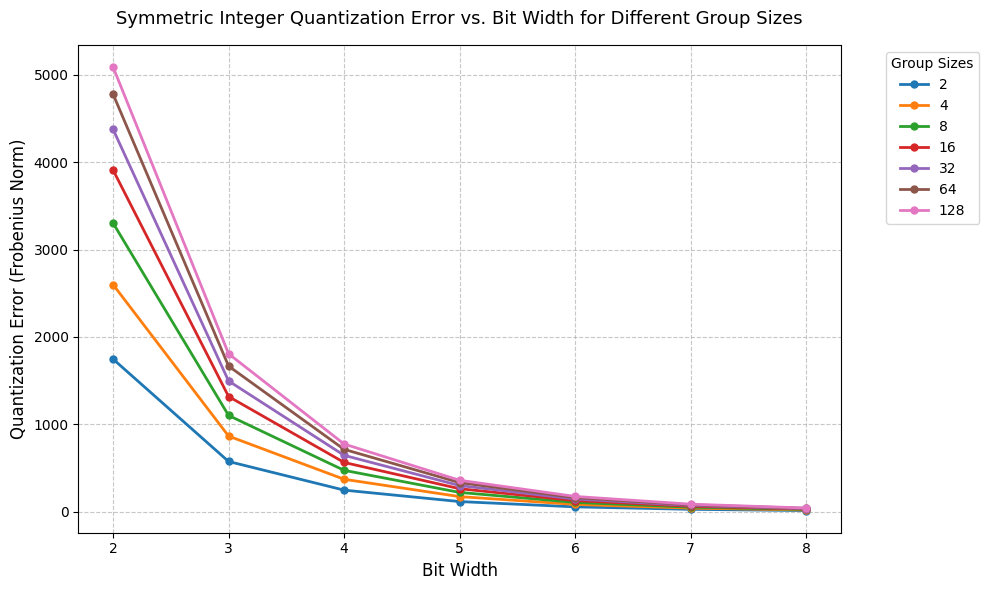

In [5]:
plt.figure(figsize=(10, 6))

for group_size in valid_group_sizes:
    errors = []
    for bitwidth in range(2, 9):
        scale_w = compute_int_scale_groupwise(w, bitwidth=bitwidth, group_size=group_size)
        qw = quantize_int_groupwise(w, scale_w, bitwidth=bitwidth, group_size=group_size)
        dqw = dequantize_int_groupwise(qw, scale_w, group_size=group_size)
        error = torch.norm(w - dqw, p='fro').item()
        errors.append(error)

    plt.plot(range(2, 9), errors, '-o', linewidth=2, markersize=5, label=f'{group_size}')

plt.grid(True, linestyle='--', alpha=0.7)
plt.xlabel('Bit Width', fontsize=12)
plt.ylabel('Quantization Error (Frobenius Norm)', fontsize=12)
plt.title('Symmetric Integer Quantization Error vs. Bit Width for Different Group Sizes', fontsize=13, pad=15)
plt.xticks(range(2, 9))
plt.legend(title='Group Sizes', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

> The plot demonstrates an exponential decrease in quantization error as the bit-width increases. Which makes sense as increasing the bit-width exponentially increases the number of representable states. Furthermore, smaller group-sizes consistently achieve lower quantization error, as illustrated by the different curves. This validates our earlier intuition about group size's impact on quantization accuracy.

---

## 5.  Post-Training Quantization Experiments

We’ve now explored how linear **symmetric** quantization works and how the group size and bit-width affect quantization error. So far however, we have only applied it on an example tensor. Now let’s apply it to the parameters of your trained model and evaluate its impact on **task accuracy**, which ultimately matters most.

We'll do this by implementing a custom `nn.Module` that performs static quantization on the weights using the ```quantize_int_groupwise``` function we have defined before, and dynamic quantization on the activations where the scale is computed on the fly. The layer will store quantized weights, biases (if present), and quantization parameters (`scale`) as non-trainable buffers in a `nn.Module` object. The object will also implement the logic for a forward pass that involves **dequantizing the weights using the scale** and **dynamically quantizing and de-quantizing** and then performing the linear operations.

In [6]:
import torch.nn as nn 
import torch.nn.functional as F


class QLinear(nn.Module): 
    def __init__(self, in_features, out_features, bias=False, bitwidth=8, group_size=None): 
        super(QLinear, self).__init__()
        if group_size == None: 
            group_size = in_features
        assert in_features % group_size == 0 

        self.group_size = group_size
        self.in_features = in_features
        self.out_features = out_features
        self.bitwidth = bitwidth

        self.register_buffer('weight', torch.zeros(out_features, in_features, dtype=self.get_dtype(), requires_grad=False))
        if bias: 
            self.register_buffer('bias', torch.randn(out_features, dtype=torch.float32))
        else: 
            self.bias = None
        self.register_buffer('scale', torch.randn(out_features * (in_features // group_size), dtype=torch.float32))
        
    @classmethod
    def from_linear(cls, linear_layer: nn.Linear, bitwidth=8, group_size=None):
        """used to initialize a QLinear layer from a nn.Linear layer"""
        has_bias = linear_layer.bias is not None
        qlinear = cls(linear_layer.in_features, linear_layer.out_features, has_bias, bitwidth, group_size=group_size)
        scale = compute_int_scale_groupwise(linear_layer.weight, bitwidth, group_size=group_size)
        qlinear.scale.data = scale
        if has_bias:
            qlinear.bias.data = linear_layer.bias.data
        qlinear.weight.data = quantize_int_groupwise(linear_layer.weight, scale, bitwidth=bitwidth, group_size=group_size)
        return qlinear

    def forward(self, x): 
        """Dynamicaly quatizes the activations (x), staticly dequantizes the weights (qw)"""
        x_scale = compute_int_scale(x, bitwidth=8)
        qx = quantize_int(x, x_scale, bitwidth=8)
        dqx = dequantize_int(qx, x_scale)
        dqw = dequantize_int_groupwise(self.weight, self.scale, self.group_size) 
        return F.linear(dqx, dqw, self.bias)

    def get_dtype(self): 
        """Determines the weight storage type given the quantized bitwidth"""
        if self.bitwidth <= 8: 
            return torch.int8 
        else: 
            return torch.int32

    def __repr__(self):
        return f"QLinear(in_features={self.in_features}, out_features={self.out_features}, bias={self.bias is not None}, bitwidth={self.bitwidth})"

###  Replacing Linear Layers with Quantized Versions

Now that we have defined our quantized version of a linear layer (`QLinear`), we can quantize the entire model by replacing all `nn.linear`layer instances with `QLinear`. In the next cell we define a recursive function to do this by searching through the model tree. We avoid quantizing the output layer, as it can be sensitive to the noise quantization introduces.  


In [7]:
def quantize_module_int(module, skip_layers=["model.linear"], parent_name='', bitwidth=8, group_size=32):
    """Recursively Quantized a torch nn.Module, replacing all nn.Linear layers with QLinear's excluding those in 'skip_layers'"""
    skip_layers = skip_layers or []
    
    for name, layer in module.named_children():
        full_name = f"{parent_name}.{name}" if parent_name else name
        
        if full_name in skip_layers:
            continue
            
        if isinstance(layer, nn.Linear):
            setattr(module, name, QLinear.from_linear(layer, bitwidth=bitwidth, group_size=group_size))
        else:
            quantize_module_int(layer, bitwidth=bitwidth, group_size=group_size, skip_layers=skip_layers, parent_name=full_name)

###  Evaluating Accuracy vs. Post-Training Quantization

Now that we have defined the functions required to quantize the model using symmetric linear group-wise integer quantization with varying bit-widths and group sizes, we can evaluate the impact of these parameters on task accuracy by measuring the loss on the test set. In the next cell, we will compute the test loss across bit-widths ranging from 2 to 8 and group sizes specified by `valid_group_sizes`.

Group Size: 64, Bitwidth: 8: 100%|██████████████| 14/14 [01:45<00:00,  7.52s/it]


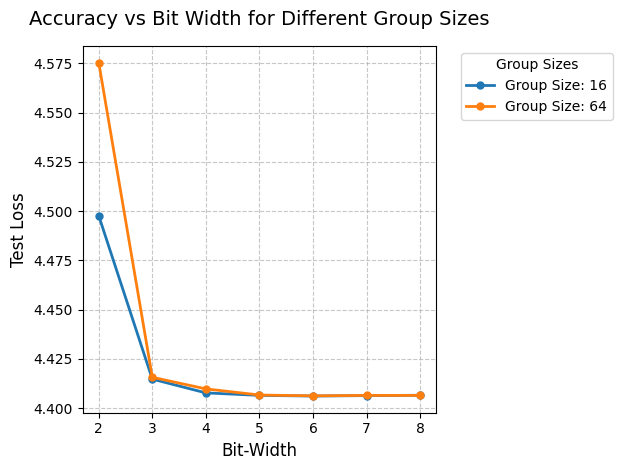

In [8]:
import os
import logging
import pytorch_lightning as pl
from src.lab1.shakespeare_trainer import ShakespeareModule
from tqdm import tqdm
import matplotlib.pyplot as plt
import contextlib

# Suppress PyTorch Lightning logs
logging.getLogger("pytorch_lightning").setLevel(logging.ERROR)

def suppress_output():
    return contextlib.redirect_stdout(open(os.devnull, 'w'))

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

trainer = pl.Trainer(
    max_epochs=1,
    accelerator="auto",
    devices="auto",
    precision=32,
    enable_progress_bar=False,
    logger=False,
    enable_model_summary=False,
)

valid_group_sizes = [16, 64]

plt.figure(figsize=(10, 6))
total_steps = len(valid_group_sizes) * (9 - 2)
pbar = tqdm(total=total_steps, desc="Overall Progress")

ptq_accuracies = {}
for group_size in valid_group_sizes:
    accuracy = []
    for bitwidth in range(2, 9):
        module = ShakespeareModule.load_from_checkpoint("src/lab1/checkpoints/float-best.ckpt")
        quantize_module_int(module, bitwidth=bitwidth, group_size=group_size)
        with suppress_output():
            result = trainer.test(module, verbose=False)
        accuracy.append(result[0]['test_loss'])
        pbar.set_description(f"Group Size: {group_size}, Bitwidth: {bitwidth}")
        pbar.update(1)
    plt.plot(range(2, 9), accuracy, '-o', linewidth=2, markersize=5, label=f'Group Size: {group_size}')
    ptq_accuracies[group_size] = accuracy

pbar.close()

plt.grid(True, linestyle='--', alpha=0.7)
plt.xlabel('Bit-Width', fontsize=12)
plt.ylabel('Test Loss', fontsize=12)
plt.title('Accuracy vs Bit Width for Different Group Sizes', fontsize=14, pad=15)
plt.xticks(range(2, 9))
plt.legend(title='Group Sizes', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

###  The Impact of Bit-Width on Quantization in Neural Networks

As shown in the figures and interactive plots above, reducing the weight bit-width below 4 bits leads to a significant degradation in model performance, evidenced by a marked increase in test loss. While using smaller group sizes, increasing the granularity of quantization can mitigate this effect to some extent, it does not fully preserve task accuracy. This observation aligns with prior findings: aggressive quantization below 4 bits introduces substantial error that finer local adaptation alone cannot overcome.

> **Post-Training Quantization below 4-bits results in significantly reduced task performance**

However, despite these limitations, recent research shows that extreme quantization when applied carefully can still produce competitive models. Instead of treating sub 4-bit quantization as inherently flawed, we can use **task-aware quantization techniques** that restructure the computation entirely, such as **ternary** and **binary quantization**. These methods don't just compress precision, they reformulate how the network operates.

---

## 6.  Ternary Quantization & QAT

One particularly effective form of extreme quantization is **ternary quantization**, where weights and/or activations are constrained to the set:

$$
\{-1, 0, 1\}
$$

This drastically simplifies the required computations: multiply-accumulate (MAC) operations reduce to a combination of sparse additions and subtractions. Since zero-valued weights require no computation, this naturally induces sparsity and leads to **reduced memory bandwidth** and **lower power usage**. These benefits are particularly valuable on edge devices.

For example, consider computing a dot product between input **$x = [x_1, x_2, x_3, x_4]$** and ternary weights **$w = [1, 0, -1, 1]$**:

Traditional MAC:  
$$ y = x_1 \cdot 1 + x_2 \cdot 0 + x_3 \cdot (-1) + x_4 \cdot 1 $$  
Simplified:  
$$ y = x_1 - x_3 + x_4 $$  

The zero weight eliminates one operation entirely, while the ±1 weights convert multiplications into simple additions/subtractions, offering significant compute savings without floating-point multipliers.

---


###  Implementing Ternary Quantization

Let’s now implement **ternary quantization**, where a full-precision weight matrix $W \in \mathbb{R}^{k \times n}$ is mapped to a ternary matrix $\hat{W} \in \{-1, 0, 1\}^{k \times n}$.

A widely used and effective approach is **absmean thresholding**, which first defines a pruning threshold $\Delta$ based on the average absolute value of the weights:

$$
\Delta = m \cdot \frac{1}{|W|} \sum_{i,j} |W_{i,j}|
$$

Here, $m$ is a tunable multiplier (typically in $0.75$) [Zhu et al., 2016](https://arxiv.org/abs/1605.04711)., and $\Delta$ determines which weights are kept (quantized to ±1) and which are pruned to 0.

The ternarization rule is:

$$
\hat{W}_{i,j} = 
\begin{cases}
+1 & \text{if } W_{i,j} > \Delta \\
-1 & \text{if } W_{i,j} < -\Delta \\
0  & \text{otherwise}
\end{cases}
$$

After ternarization, the nonzero entries can be **rescaled** using a separate factor $\alpha$, computed as the average magnitude of the surviving weights:

$$
\alpha = \frac{1}{|\{i,j: |W_{i,j}| > \Delta\}|} \sum_{|W_{i,j}| > \Delta} |W_{i,j}|
$$

The final dequantized matrix is then:

$$
\hat{W}_{\text{scaled}} = \alpha \cdot \hat{W}
$$

In practice, both $\Delta$ and $\alpha$ can be computed **per group** of input features for improved accuracy.

This method effectively maps dense floating-point weights to a sparse ternary representation, significantly reducing memory and computation costs with minimal accuracy degradation.

>  In the next cell, we’ll implement this method in PyTorch using **group-wise thresholding and scaling** for improved fidelity.



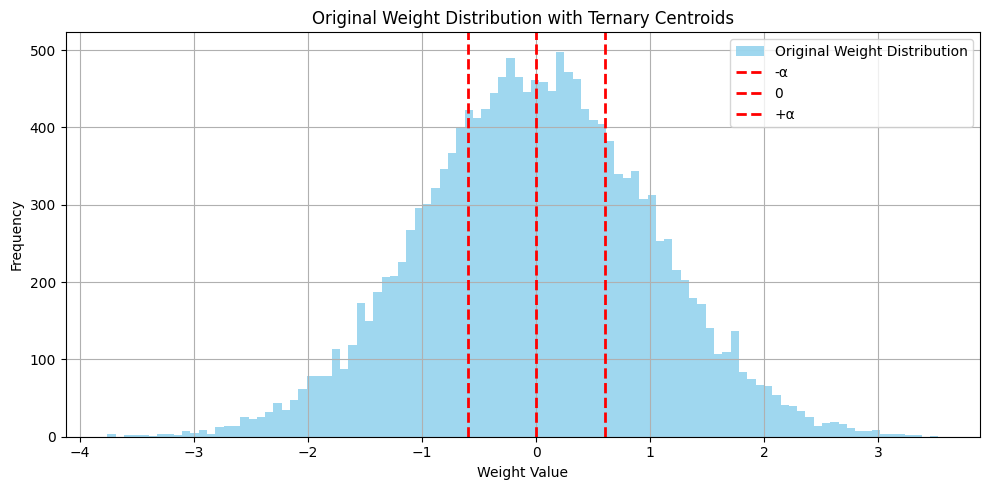

In [9]:
import torch
import matplotlib.pyplot as plt

def compute_ternary_params(w: torch.Tensor, m: float=0.75):
    delta = m * w.abs().mean()
    keep = w.abs() > delta
    keep_cnt = keep.sum(dim=1)                   
    keep_sum = (w.abs() * keep).sum(dim=1)
    alpha = torch.where(keep_cnt > 0,
                        keep_sum / keep_cnt,
                        delta.detach())
    return delta, alpha

def quantize_ternary(w: torch.tensor, delta: float): 
    qw = torch.where(w > delta, 1.0, torch.where(w < -delta, -1.0, 0.0))
    return qw

def dequantize_ternary(qw: torch.Tensor, alpha: float):
    return qw * alpha


# Generate original weight matrix
w = torch.randn(128, 128)

# Apply quantization
delta, alpha = compute_ternary_params(w)
qw = quantize_ternary(w, delta)
dqw = dequantize_ternary(qw, alpha)

# Plot distribution of original weights
plt.figure(figsize=(10, 5))
plt.hist(w.flatten().cpu().numpy(), bins=100, color='skyblue', alpha=0.8, label='Original Weight Distribution')

# Plot ternary centroids
for val, label in [(-delta.item(), '-α'), (0.0, '0'), (delta.item(), '+α')]:
    plt.axvline(val, color='red', linestyle='--', linewidth=2, label=label)

plt.title("Original Weight Distribution with Ternary Centroids")
plt.xlabel("Weight Value")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

On the graph above, you can see the original weight distribution and the dequantized ternary matrix. The dotted red lines are the representable levels of the ternary matrix.

###  Training with Non-Differentiable Quantization Functions

You can see in the graph above the original weight distribution and the ternary quantization levels (dotted red lines). The three quantization levels drastically reduce the number of bits needed per weight, resulting in major memory and compute savings. Theoretically, ternary quantization only requires only 1.58 bits per weight, as $log_2(3) = 1.58$ and there are only three possible states: -α, 0, and +α.

 However, this quantization comes at a significant cost: **information loss**. Such coarse quantization degrades model performance unless the network is trained to be robust to it.

---

###  The Key Question

> **How can we aggressively reduce bit-width to 1.58 bits per weight while preserving accuracy?**

The answer: **Quantization Aware Training (QAT)**—a technique that simulates quantization during training so the model can adapt to it's constraints.

---

###  The Gradient Problem

Quantized Aware Training is non-trivial because **quantization is non-differentiable**.

Take the ternary quantization function:

$
\hat{W}_{i,j} = Q^T(W_{i,j}) = 
\begin{cases}
+1 & \text{if } W_{i,j} > \Delta \\
-1 & \text{if } W_{i,j} < -\Delta \\
0  & \text{otherwise}
\end{cases}
$

As shown in the plots below, the quantization function is a step map (left), and its derivative is either zero almost everywhere or undefined at the thresholds $\pm\Delta$ (right):

### $\frac{d\hat{W}}{dW} = 0 \quad \text{(almost everywhere)}, \quad \text{undefined at } \Delta, \text{and} -\Delta$

This breaks Backpropagation: As the gradients must flow through the quantization function, from $\hat{W}$ to $W}$. For instance, the below equation describes gradient descent (e.g. how we update the parameters of the mdoel, to reduce the loss). To do, so the gradient of the models loss with respect to its parameters $\frac{\partial \mathcal{L}}{\partial W} $ must be able to be computed. 
<br>
<br>
$
W_{t+1} = W_t - \eta \cdot \frac{\partial \mathcal{L}}{\partial W} \\
$

Now, if we unpack this gradient using the chain rule, we can write the gradient of the loss with respect to the weights as $ \frac{\partial \mathcal{L}}{\partial W}  = \frac{\partial \mathcal{L}}{\partial \hat{W}} \cdot \frac{d\hat{W}}{dW}$. Substituting that into the above gradient descent equation, we get 


$
W_{t+1} =  W_t - \eta \cdot \frac{\partial \mathcal{L}}{\partial \hat{W}} \cdot \frac{d\hat{W}}{dW} \\
$

However, the issue with this formulation of the gradient descent is that we know from the figure above, that the gradient of $\frac{d\hat{W}}{dW}$ is either undefined or $0$, and as a result the gradient updates to $W_{t+1}$ will either be undefined or 0. This breaks gradient descent, and stops the network learning. 

---

###  Straight-Through Estimator (STE)

To work around this, we use **approximate gradients** like the **Straight-Through Estimator (STE)**:

$
\frac{d\hat{W}}{dW} \approx 1
$

STE bypasses the quantization op in the backward pass, letting gradients flow through as if quantization didn't occur. While crude, it works remarkably well in practice. It essentially sets the $\frac{d\hat{W}}{dW}$ to 1, effectively pretending as if the operation was never used in the forward pass. 

<center><img src="./assets/lab1/gradient_and_ste_gradient.png" width="900"/></center>

---

###  Putting It All Together: QAT in Practice

We start with a full-precision model, e.g.,  as a very simple example take a linear layer (without bias):

$
y = W x
$

During Ternary QAT, we **simulate quantization during the forward pass**:

$
\hat{y} = Q^T(W) \cdot x
$

But during the backward pass, we apply STE on the quantization function $Q^T$ and backpropagate to the weights as if they were never quantized:

$
 \frac{\partial \hat{y}}{\partial Q(W)} \approx \frac{\partial \hat{y}}{\partial W}
$

Then once, training is complete, we can drop the full precision weights $W$ and replace them with the quantized weights $\hat{W} = Q^T(W)$ and use the quantized weights for inference.

---

###  Outcome

The outcome of QAT is a model that **learns to be robust to quantization**, maintaining strong accuracy even at low bit-widths (4-bit, ternary, binary).

> 🔜 So now let's give it a go with the ternary example. Using just 1.58 bits per weight!   

To implement it now define a custom **autograd function** to apply ternary quantization to weights during the forward pass, while using the **Straight-Through Estimator (STE)** in the backward pass. This is different, to the earlier post-training quantization process where we only had to implement the quantized forward pass. Bear in mind, that in the rest of the lab we will implement simulated quantization, so we can perform full Quantized-Aware-Training. Once QAT is complete, the simulation can be droppped, and specialized low-biwidth kernels can be utilized for improved memory and latency.

> The code below implements the forward and backward passes of ternary group-wise weight quantization and per-tensor int8 activation quantization. 


In [10]:
import torch
from torch.autograd import Function

def compute_ternary_params_groupwise(w: torch.Tensor,
                                     group_size: int = 128,
                                     m: float = 0.75):
    """
    Compute groupwise ternary quantization parameters (threshold Δ and scale α).

    For each group of weights:
      - Computes Δ = m × mean(|w|)
      - Selects weights with |w| > Δ
      - Computes α = mean(|w| over surviving weights), or Δ if none survive
    Returns per-group (delta, scale) tensors.
    """
    # Ensure that the number of input features is divisible by the group size
    assert w.shape[1] % group_size == 0, \
        "in_features must be divisible by group_size"

    # Compute absolute values and reshape into groups
    # Each group has 'group_size' weights
    w_abs = w.abs().reshape(-1, group_size)  # (num_groups, group_size)

    # Compute the per-group threshold Δ:
    # Δ = m × mean(|w|)  — scaling the average magnitude in each group
    delta = m * w_abs.mean(dim=1)  # (num_groups,)

    # Identify which weights exceed the threshold (to be kept)
    # Broadcasting delta per group across all elements in that group
    keep = w_abs > delta.unsqueeze(1)  # (num_groups, group_size)

    # Compute the number of surviving weights per group
    keep_cnt = keep.sum(dim=1)  # (num_groups,)

    # Compute the sum of the magnitudes of those surviving weights
    keep_sum = (w_abs * keep).sum(dim=1)  # (num_groups,)

    # Compute the scaling factor α per group:
    # α = mean(|w|) over the kept weights; if no weights survive (all pruned),
    # use Δ instead to avoid divide-by-zero and maintain numeric stability.
    scale = torch.where(keep_cnt > 0,
                        keep_sum / keep_cnt,
                        delta.detach())  # (num_groups,)

    # Return per-group threshold (Δ) and scale (α)
    return delta, scale


def quantize_ternary_groupwise(w: torch.Tensor,
                               delta: torch.Tensor,
                               group_size: int = 128):
    """
    Apply groupwise ternary quantization to weights.

    For each group:
      - +1 if w > Δ
      - −1 if w < −Δ
      -  0 otherwise
    """
    # Reshape weights into groups
    w_r = w.reshape(-1, group_size)  # (num_groups, group_size)

    # Expand delta for broadcasting during comparison
    delta = delta.unsqueeze(1)  # (num_groups, 1)

    # Apply ternary quantization:
    #   if w >  Δ  →  +1
    #   if w < -Δ  →  -1
    #   else       →   0
    qw_r = torch.where(
        w_r > delta, 1.0,
        torch.where(w_r < -delta, -1.0, 0.0)
    )

    # Reshape back to original tensor shape
    return qw_r.reshape_as(w)


def dequantize_ternary_groupwise(qw: torch.Tensor,
                                 scale: torch.Tensor,
                                 group_size: int = 128):
    """
    Dequantize ternary weights back to continuous approximation.

    Multiplies ternary weights (+1/0/−1) by their corresponding group scale α.
    """
    # Reshape quantized weights into groups
    qw_r = qw.reshape(-1, group_size)

    # Broadcast scale per group
    scale = scale.unsqueeze(1)  # (num_groups, 1)

    # Reconstruct approximate weights by rescaling ternary values
    return (qw_r * scale).reshape_as(qw)


class GroupTernaryFakeQuant(Function):
    """
    Custom autograd Function for groupwise ternary fake quantization.

    Simulates ternary quantization during forward pass using Δ and α,
    but uses a straight-through estimator (STE) for backward gradients.
    """
    @staticmethod
    def forward(ctx, w: torch.Tensor,
                group_size: int = 128,
                m: float = 0.75):
        # Compute per-group quantization parameters (Δ and α)
        delta, scale = compute_ternary_params_groupwise(
            w, group_size, m=m
        )

        # Perform quantization and dequantization using those parameters
        qw = quantize_ternary_groupwise(w, delta, group_size)
        dqw = dequantize_ternary_groupwise(qw, scale, group_size)

        # Save scale for use during backward pass (STE)
        ctx.save_for_backward(scale)

        # Return fake-quantized weights (ternary approximation)
        return dqw

    @staticmethod
    def backward(ctx, grad_output):
        # Straight-Through Estimator (STE):
        # Pass gradients through unchanged (pretend quantization is identity)
        return grad_output, None, None


class PerTensorInt8QFakeQuant(Function):
    """
    Custom autograd Function for per-tensor int8 fake quantization.

    Simulates symmetric 8-bit quantization and dequantization during forward,
    while allowing unmodified gradients to pass through in backward (STE).
    """
    @staticmethod
    def forward(ctx, x):
        # Compute per-tensor scaling factor for int8 quantization
        scale = compute_int_scale(x, bitwidth=8)

        # Quantize and then dequantize to simulate int8 behavior
        qx = quantize_int(x, scale, bitwidth=8)
        dqx = dequantize_int(qx, scale)

        # Save scale for potential backward computation
        ctx.save_for_backward(scale)

        # Return fake-quantized tensor (still float, but int8-simulated)
        return dqx

    @staticmethod
    def backward(ctx, grad_output):
        # Pass-through gradient (STE again)
        scale = ctx.saved_tensors
        grad_input = grad_output.clone()
        return grad_input


def fakequantize_weight_ternary(w,
                                group_size: int = 128,
                                m: float = 0.75):
    """
    Convenience wrapper for applying groupwise ternary fake quantization
    to weight tensors.
    """
    return GroupTernaryFakeQuant.apply(w, group_size, m)


def fakequantize_activation_int8(w):
    """
    Convenience wrapper for applying per-tensor int8 fake quantization
    to activation tensors.
    """
    return PerTensorInt8QFakeQuant.apply(w)


###  Integrating Ternary Quantization into a Linear Layer

Next, we wrap the ternary weight and int8 activation quantization functionsfunction inside a custom `TernaryLinear` layer. This layer behaves like a standard `nn.Linear`, but quantizes its weights to the ternary set {−1, 0, 1} during the forward pass, and implements the correct STE estimation for the backward pass.

**This makes it easy to plug into any PyTorch model and optimize, as if it were a completely differentiable network!**

In [11]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class TernaryLinear(nn.Linear):
    def __init__(self, in_features, out_features, bias=True, group_size=256):
        super().__init__(in_features, out_features, bias)
        self.group_size = group_size
        
    def forward(self, x):
        dqx = fakequantize_activation_int8(x)
        dqw = fakequantize_weight_ternary(self.weight, self.group_size)
        return F.linear(dqx, dqw, self.bias)

    @classmethod
    def from_linear(cls, linear_layer: nn.Linear, group_size=64): 
        device = linear_layer.weight.device
        has_bias = linear_layer.bias is not None
        tlinear = cls(linear_layer.in_features, linear_layer.out_features, has_bias, group_size)
        tlinear.weight.data = linear_layer.weight.data
        if has_bias: 
            tlinear.bias.data = linear_layer.bias.data
        return tlinear.to(device)
        
    def __repr__(self): 
        return f"TernaryLinear(in_features={self.in_features}, out_features={self.out_features}, bias={self.bias is not None}, group_size={self.group_size})"

###  Recursively Replacing Layers with TernaryLinear

This function searches through the model and replaces all `nn.Linear` layers, except those specified in `skip_layers`, with their ternary quantized equivalents.

We pass the `parent_name` to preserve full layer paths, ensuring correct matching for selective replacement.


In [12]:
def quantize_module_ternary(module, skip_layers=["model.linear"], parent_name='', group_size=32):
    skip_layers = skip_layers or []
    
    for name, layer in module.named_children():
        full_name = f"{parent_name}.{name}" if parent_name else name
        
        # If this layer is in skip_layers, skip it and its children
        if full_name in skip_layers:
            continue
        
        if isinstance(layer, nn.Linear):
            setattr(module, name, TernaryLinear.from_linear(layer, group_size=group_size))
        else:
            # Recursively handle nested modules, passing along the parent_name
            quantize_module_ternary(layer, skip_layers=skip_layers, parent_name=full_name, group_size=group_size)

###  Verifying Ternary Layer Replacement

Let’s load a full precision model and apply ternary quantization to its internal linear layers. After replacement, we print the model to confirm that all expected layers have been converted. You should see instances of `TernaryLinear` in the below cell's output. 


In [13]:
from src.lab1.shakespeare_trainer import ShakespeareModule

module = ShakespeareModule(
    vocab_size      = 1024,
    d_model         = 128,
    nhead           = 8,
    num_layers      = 6,
    dim_feedforward = 512,  
    dropout         = 0.15, 
    learning_rate   = 2e-4,
    batch_size      = 64,
    sequence_length = 256,  
    num_workers     = 4,
    weight_decay    = 0.05,
    max_train_samples = 750_000,
    max_val_samples   = 1_000,
    max_test_samples  = 1_000
)


quantize_module_ternary(module)
print(module)


ShakespeareModule(
  (model): AutoRegressiveTransformer(
    (embedding): Embedding(1024, 128)
    (pos_encoder): Embedding(1024, 128)
    (transformer_blocks): ModuleList(
      (0-5): 6 x TransformerBlock(
        (self_attn): MultiHeadAttention(
          (qkv_proj): TernaryLinear(in_features=128, out_features=384, bias=True, group_size=32)
          (out_proj): TernaryLinear(in_features=128, out_features=128, bias=True, group_size=32)
          (dropout): Dropout(p=0.15, inplace=False)
        )
        (feed_forward): FeedForward(
          (linear1): TernaryLinear(in_features=128, out_features=512, bias=True, group_size=32)
          (dropout): Dropout(p=0.15, inplace=False)
          (linear2): TernaryLinear(in_features=512, out_features=128, bias=True, group_size=32)
          (activation): GELU(approximate='none')
        )
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (drop

###  Time to Train!

With ternary quantization applied, we’re ready to fine-tune the model using quantization-aware training. Let’s see how well the model performs under aggressive compression!


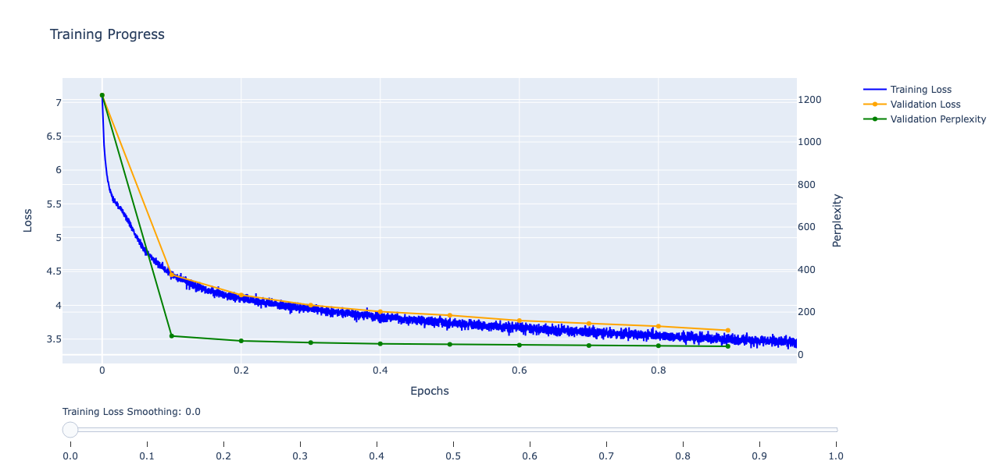

In [14]:
from pytorch_lightning.callbacks import ModelCheckpoint
from src.lab1.shakespeare_trainer import PlotlyCallback
import pytorch_lightning as pl 
import os 

os.environ["TOKENIZERS_PARALLELISM"] = "false"

checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',                                 # the metric to monitor 
    mode='max',                                        # the mode to use for the monitor
    save_top_k=1,                                      # the number of top models to save
    save_last=True,                                    # whether to save the last model
    dirpath='./src/lab1/checkpoints',                 # the path to save the model during training
    filename='ternary-best'                                    # save the best model as 'best.ckpt'
)


trainer = pl.Trainer(
    max_epochs=1, 
    callbacks=[PlotlyCallback(val_check_interval=0.1), checkpoint_callback],  # the callbacks to use during training
    accelerator="auto",                                 # the accelerator to use during training
    devices="auto",                                     # the devices to use during training
    precision="16-mixed",                                        # the precision to use during training
    val_check_interval=0.1,    
)
trainer.fit(module)

In [15]:
ternary_result = trainer.test(module)

Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss           3.8307833671569824
     test_perplexity        48.752296447753906
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


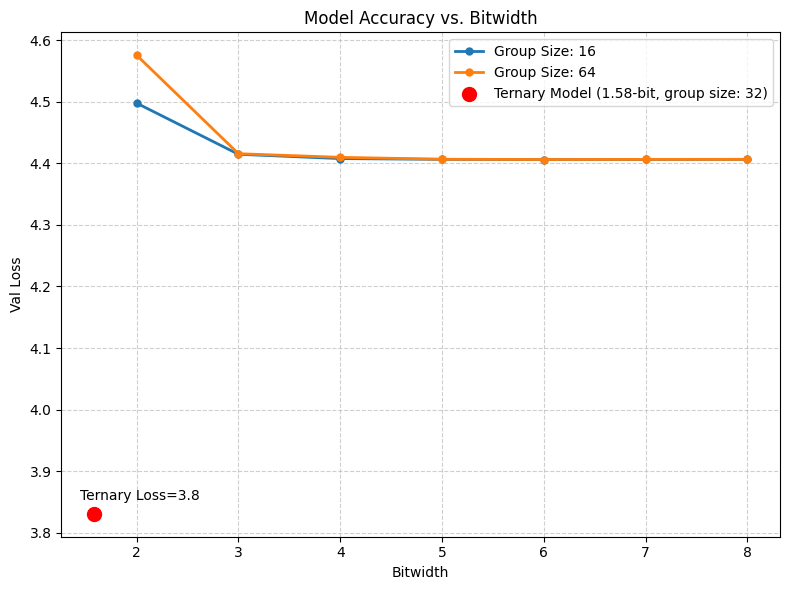

In [16]:
import matplotlib.pyplot as plt

# Assume accuracy is in percentage already, if not: [a * 100 for a in accuracy]
plt.figure(figsize=(8, 6))

# Plot the accuracy vs. bitwidth
for group_size in valid_group_sizes: 
    plt.plot(range(2, 9), ptq_accuracies[group_size], '-o', linewidth=2, markersize=5, label=f'Group Size: {group_size}')

# Highlight the ternary (2-bit) model
ternary_bit = 1.58
ternary_loss = ternary_result[0]['test_loss'] 
plt.scatter([ternary_bit], [ternary_loss], color='red', s=100, label='Ternary Model (1.58-bit, group size: 32)')
plt.annotate(f'Ternary Loss={ternary_loss:.1f}', (ternary_bit, ternary_loss), textcoords="offset points", xytext=(-10,10), ha='left')

# Labels and title
plt.xlabel('Bitwidth')
plt.ylabel('Val Loss')
plt.title('Model Accuracy vs. Bitwidth')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()


You can see from this graph that the ternary model, with only 1.58 bits per weight achieves a significantly lower test loss than the standard 2-bit post-training quantized model.

## 7.  Binary Quantization & QAT

Lets now take this a step further with Binary quantization. Binary Quantization takes compression to the extreme: each weight is constrained to one of two values,

$$
\hat{W}_{i,j} \in \{-1, +1\},
$$

allowing **1-bit representation per weight** achieve a **32× compression** over 32-bit floats. On hardware, this enables **fast, energy-efficient inference** via **bitwise operations** (e.g., XNOR + popcount) instead of multiply-accumulate (MAC).

> Binary networks are thus ultra-compact and tailored for digital efficiency.

---

###  Binarizing Weights

The simplest approach uses the **sign function**:

$$
\hat{W} = \text{sign}(W) =
\begin{cases}
+1 & \text{if } W \ge 0 \\
-1 & \text{otherwise}
\end{cases}
$$

But this discards magnitude. To recover some expressivity, we introduce a **scaling factor**:

$$
\hat{W}_{\text{scaled}} = \alpha \cdot \text{sign}(W), \quad \alpha = \frac{1}{|W|} \sum_{i,j} |W_{i,j}|
$$

This scaling preserves coarse magnitude information without increasing bitwidth. Let's implement it below


In [17]:
def compute_binary_scale(w: torch.Tensor): 
    return w.abs().mean()

def quantize_binary(w: torch.Tensor, alpha: torch.Tensor):
    return torch.sign(w) * alpha

def dequantize_binary(qw: torch.Tensor, alpha: torch.Tensor):
    return qw * alpha

w = torch.randn(5)
alpha = compute_binary_scale(w)
qw = quantize_binary(w, alpha)
dq_w = dequantize_binary(qw, alpha)
print("Binary Weight: ",qw)
print("Scale: ", alpha)
print("Dequantized Weight: ",dq_w)

Binary Weight:  tensor([-0.4874, -0.4874,  0.4874,  0.4874,  0.4874])
Scale:  tensor(0.4874)
Dequantized Weight:  tensor([-0.2376, -0.2376,  0.2376,  0.2376,  0.2376])


###  Non-Differentiability & The Gradient Problem

The `sign` function is non-differentiable, with zero gradient almost everywhere:

$$
\frac{d \hat{W}}{dW} = 0
$$

This causes **vanishing gradients** during backpropagation. To enable training, we again use the **Straight-Through Estimator (STE)**:

$$
\frac{d \hat{W}}{dW} \approx 1
$$

This approximation allows gradients to flow through the quantization step.

---

###  Binary Quantization in Training

During training, we simulate quantization in the **forward pass** with:

$$
\hat{W} = \alpha \cdot \text{sign}(W),
$$

while the **backward pass** uses STE to propagate gradients through the full-precision weights. At **inference**, only `sign(W)` and the scalar $\alpha$ are retained. Let's add the STE to the backward pass of the function by running the cell below. 


In [18]:
import torch
from torch.autograd import Function


class PerTensorBinaryFakeQuant(Function):
    """
    Custom autograd Function for per-tensor binary fake quantization.

    This simulates binary weight quantization where each weight is replaced by
    either +1 or −1, scaled by a learned (or computed) scalar α.

    Forward:
        - Compute α (scale) from weight magnitudes
        - Quantize weights to {−1, +1}
        - Dequantize by rescaling quantized values with α
    Backward:
        - Uses a Straight-Through Estimator (STE) so gradients flow unmodified.
    """
    @staticmethod
    def forward(ctx, w):
        # Compute per-tensor scaling factor α (usually mean(|w|))
        alpha = compute_binary_scale(w)

        # Quantize weights to binary representation {−1, +1}
        qw = quantize_binary(w, alpha)

        # Dequantize to approximate full-precision weights
        dqw = dequantize_binary(qw, alpha)

        # Return fake-quantized tensor (values in continuous domain)
        return dqw

    @staticmethod
    def backward(ctx, grad_output):
        # Straight-Through Estimator (STE):
        # Pass gradients directly without modification (no quantization gradient)
        return grad_output, None


def fakequantize_weight_binary(w):
    """
    Convenience wrapper for applying per-tensor binary fake quantization.

    Args:
        w (torch.Tensor): Weight tensor to quantize.

    Returns:
        torch.Tensor: Fake-quantized version of `w`, where forward values are
        binary-scaled but backward gradients remain continuous.
    """
    return PerTensorBinaryFakeQuant.apply(w)

---

###  Quantization Aware Training (QAT)

To retain accuracy with binary weights, we use **Quantization Aware Training (QAT)**, which simulates quantization during training so that the model learns to be robust to low-precision constraints.

Because binary quantization is an extreme form of compression, it's important to apply **group-wise quantization**, where each group of weights (e.g., 64 or 128 values) shares a single scaling factor:

$$
\hat{W}_{i,j} = \alpha_g \cdot \text{sign}(W_{i,j}), \quad \alpha_g = \frac{1}{|W_g|} \sum_{W_g} |W_{i,j}|
$$

This preserves coarse magnitude information within each group while maintaining 1-bit weights.

During backpropagation, gradients are propagated through the quantization step using the **Straight-Through Estimator (STE)**:

$$
\frac{\partial \mathcal{L}}{\partial \hat{W}} \approx \frac{\partial \mathcal{L}}{\partial W}
$$

You can see this implemented below.


In [19]:
def compute_binary_scale_groupwise(w: torch.Tensor, group_size: int = 128): 
    w_reshaped = w.reshape(-1, group_size)
    return w_reshaped.abs().mean(dim=-1)

def quantize_binary_groupwise(w: torch.Tensor, alpha: torch.Tensor, group_size: int = 128):
    w_reshaped = w.reshape(-1, group_size)
    qw_reshaped = torch.sign(w_reshaped)
    qw = qw_reshaped.reshape(w.shape)
    return qw

def dequantize_binary_groupwise(qw: torch.Tensor, alpha: torch.Tensor, group_size: int = 128):
    qw_reshaped = qw.reshape(-1, group_size)
    dqw_reshaped = qw_reshaped * alpha
    dqw = dqw_reshaped.reshape(qw.shape)
    return dqw

class PerGroupBinaryFakeQuant(Function):
    @staticmethod
    def forward(ctx, w, group_size=128):
        w_reshaped = w.reshape(-1, group_size)
        alpha = w_reshaped.abs().mean(dim=1, keepdim=True)
        q_w = w_reshaped.sign() * alpha
        return q_w.reshape(w.shape)

    @staticmethod
    def backward(ctx, grad_output):
        return grad_output, None  # STE

def fakequantize_weight_binary(w, group_size=128):
    return PerGroupBinaryFakeQuant.apply(w, group_size)


w = torch.randn(128, 128, requires_grad=True)
w_q = fakequantize_weight_binary(w, group_size=32)


> Lets now integrate this group-wise binary quantization function into a custom `BinaryLinear` layer.

###  BinaryLinear Layer

Below, we utilize these per-group binary quantization function into a linear layer class object, so that we can introduce them into our pytorch models. 

---

In [20]:
import torch.nn as nn
import torch.nn.functional as F

class BinaryLinear(nn.Linear):
    def __init__(self, in_features, out_features, bias=True, group_size=128):
        super().__init__(in_features, out_features, bias)
        self.group_size = group_size
        
    def forward(self, x):
        d_w = fakequantize_weight_binary(self.weight, self.group_size)
        d_x = fakequantize_activation_int8(x)
        return F.linear(d_x, d_w.to(x.device), self.bias)

    @classmethod
    def from_linear(cls, linear_layer: nn.Linear, group_size=128):
        has_bias = linear_layer.bias is not None
        binary = cls(linear_layer.in_features, linear_layer.out_features, bias=has_bias, group_size=group_size)
        binary.weight.data = linear_layer.weight.data.clone()
        if has_bias:
            binary.bias.data = linear_layer.bias.data.clone()
        return binary.to(linear_layer.weight.device)

    def __repr__(self):
        return f"BinaryLinear(in_features={self.in_features}, out_features={self.out_features}, bias={self.bias is not None}, group_size={self.group_size})"

###  Recursively Replacing Layers

To apply quantization to the model inplace, we replace each `nn.Linear` layer with our custom `BinaryLinear` version. This can be done recursively, skipping any layers we want to preserve (e.g., output heads).

---

In [21]:
def quantize_module_binary(module, skip_layers=['model.linear'], parent_name='', group_size=32):
    for name, child in module.named_children():
        full_name = f"{parent_name}.{name}" if parent_name else name

        if full_name in skip_layers:
            continue

        if isinstance(child, nn.Linear):
            setattr(module, name, BinaryLinear.from_linear(child, group_size=group_size))
        else:
            quantize_module_binary(child, skip_layers, full_name, group_size=group_size)

In [22]:
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
from src.lab1.shakespeare_trainer import PlotlyCallback

module = ShakespeareModule(
    vocab_size      = 1024,
    d_model         = 128,
    nhead           = 8,
    num_layers      = 6,
    dim_feedforward = 512,  
    dropout         = 0.15, 
    learning_rate   = 2e-4,
    batch_size      = 64,
    sequence_length = 256,  
    num_workers     = 4,
    weight_decay    = 0.05,
    max_train_samples = 750_000,
    max_val_samples   = 1_000,
    max_test_samples  = 1_000
)


quantize_module_binary(module)
print(module)

ShakespeareModule(
  (model): AutoRegressiveTransformer(
    (embedding): Embedding(1024, 128)
    (pos_encoder): Embedding(1024, 128)
    (transformer_blocks): ModuleList(
      (0-5): 6 x TransformerBlock(
        (self_attn): MultiHeadAttention(
          (qkv_proj): BinaryLinear(in_features=128, out_features=384, bias=True, group_size=32)
          (out_proj): BinaryLinear(in_features=128, out_features=128, bias=True, group_size=32)
          (dropout): Dropout(p=0.15, inplace=False)
        )
        (feed_forward): FeedForward(
          (linear1): BinaryLinear(in_features=128, out_features=512, bias=True, group_size=32)
          (dropout): Dropout(p=0.15, inplace=False)
          (linear2): BinaryLinear(in_features=512, out_features=128, bias=True, group_size=32)
          (activation): GELU(approximate='none')
        )
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (dropout1

###  Training with Binary Quantization

You should see in the above output `BinaryLinear` layers in the model architecture. We will now train the binary network with QAT.

As with ternary networks, this teaches the model to become robust to the distortions introduced by extreme quantization.

---

In [23]:
from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint
from src.lab1.shakespeare_trainer import PlotlyCallback



# Fine-tune using binary weights
checkpoint_callback = ModelCheckpoint(
    monitor='val_perplexity',
    mode='min',
    save_top_k=1,
    save_last=True,
    dirpath='./src/lab1/checkpoints',
    filename='binary-best'
)

trainer = Trainer(
    max_epochs=1,
    callbacks=[PlotlyCallback(val_check_interval=0.1), checkpoint_callback],
    accelerator="auto",
    devices="auto",
    precision="16-mixed",
    val_check_interval=0.1
)

trainer.fit(module)

###  Testing and Visualization

After training, we evaluate the quantized model on the test set and compare performance to models quantized at higher bit-widths (e.g., 2-bit, 4-bit).

We can visualize the trade-off between **bitwidth** and **model loss/accuracy**, highlighting how the binary model (1-bit) performs relative to the ternary (1.58-bit) and standard quantized models.

---

In [24]:
binary_result = trainer.test(module)

Testing: |                                                | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_loss           3.9520952701568604
     test_perplexity         54.6434440612793
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


###  Outcome

With **just 1-bit per weight**, the model is able to maintain **surprisingly competitive performance**, especially when fine-tuned using QAT. While binary quantization removes all magnitude information, with STE-based training the model can adapt to this harsh constraint.

This represents one of the most memory- and energy-efficient forms of quantization available today, particularly suited for **edge devices, microcontrollers, and custom ASICs**.

> Next up, try combining binary **weights** with **quantized activations** for full integer inference!


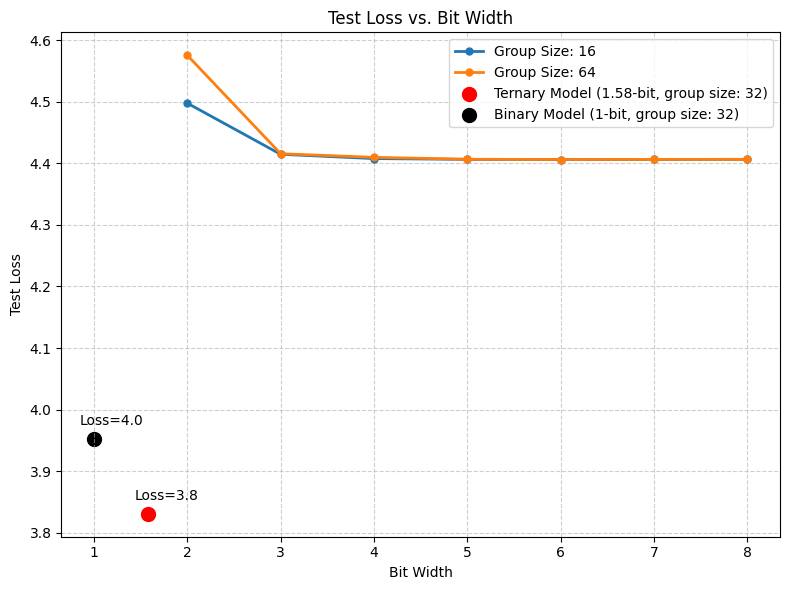

In [25]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

for group_size in valid_group_sizes: 
    plt.plot(range(2, 9), ptq_accuracies[group_size], '-o', linewidth=2, markersize=5, label=f'Group Size: {group_size}')


# Highlight the ternary (2-bit) model
ternary_bit = 1.58
ternary_acc = ternary_result[0]['test_loss'] 
plt.scatter([ternary_bit], [ternary_acc], color='red', s=100, label='Ternary Model (1.58-bit, group size: 32)')
plt.annotate(f'Loss={ternary_acc:.1f}', (ternary_bit, ternary_acc), textcoords="offset points", xytext=(-10,10), ha='left')

# Highlight binary model
binary_bit = 1.0
binary_loss = binary_result[0]['test_loss']
plt.scatter([binary_bit], [binary_loss], color='black', s=100, label='Binary Model (1-bit, group size: 32)')
plt.annotate(f'Loss={binary_loss:.1f}', (binary_bit, binary_loss), textcoords="offset points", xytext=(-10,10), ha='left')

plt.xlabel('Bit Width')
plt.ylabel('Test Loss')
plt.title('Test Loss vs. Bit Width')
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

###  Summary

In this lab, you explored how reducing model precision to very low bit-widths, such as ternary and binary, can significantly shrink memory usage and improve computational efficiency. While extreme quantization can hurt accuracy, techniques like Quantization-Aware Training help recover much of the lost performance. These findings are essential for deploying models on limited hardware and form a solid foundation for future labs focused on advanced optimization techniques.